### Advanced Prophet Models - Detecting Changes

This program builds on the previous activity, and begins with the following:

`prophet_prepare_train_data` & `analyze_model_results`

Reads in the CSV of hourly crypto trading data, conducts exploratory data analysis, and builds a forecast model using the Facebook Prophet package. With the model built, creates forecasts for future crypto prices and splits this forecast into various seasonal patterns.

**This program** continues the analysis of hourly crypto trading data, covering some advanced Prophet strategies for making forecasts, by detecting abrupt changes in the time-series trend.


# (These first steps are from the previous Activity and have already been completed)

In [3]:
# Import the required libraries and dependencies
import pandas as pd
from pathlib import Path
from prophet import Prophet
import hvplot.pandas
import datetime as dt
%matplotlib inline

### Read in the data to visualize, analyze, and forecast.

In [4]:
# Read csv file as DataFrame, with the first column as row index
data_path = Path("../Resources/bitcoin_hourly.csv")
df = pd.read_csv(data_path, index_col='date', infer_datetime_format=True, parse_dates=True)

# Drop columns that won't be used
df = df.drop('volume', axis=1)

# Preview the dataset
df

,close
date,
2017-08-17 05:00:00,4315.32
2017-08-17 06:00:00,4324.35
2017-08-17 07:00:00,4349.99
2017-08-17 08:00:00,4360.69
2017-08-17 09:00:00,4444.00
...,...
2021-02-12 01:00:00,48477.50
2021-02-12 02:00:00,47935.66
2021-02-12 03:00:00,47587.31


In [5]:
# Use hvPlot to visually inspect the price data
df['close'].hvplot()

:Curve   [date]   (close)

In [6]:
# Reset the index so that we recode the columns for Prophet
df = df.reset_index()

In [7]:
# Label the columns ds and y so that the syntax is recognized by Prophet
df.columns = ['ds', 'y']

# Drop an NaN values from the prophet_df DataFrame
# mercado_prophet_df = mercado_prophet_df.dropna()

# View dataframe shape, and the first and last five rows of the mercado_prophet_df DataFrame
display(df.shape)
display(df.head())
display(df.tail())

(30748, 2)

,ds,y
0,2017-08-17 05:00:00,4315.32
1,2017-08-17 06:00:00,4324.35
2,2017-08-17 07:00:00,4349.99
3,2017-08-17 08:00:00,4360.69
4,2017-08-17 09:00:00,4444.00


,ds,y
30743,2021-02-12 01:00:00,48477.50
30744,2021-02-12 02:00:00,47935.66
30745,2021-02-12 03:00:00,47587.31
30746,2021-02-12 04:00:00,47271.55
30747,2021-02-12 05:00:00,47398.79


### Fitting the Model

In [8]:
# Call the Prophet function, store as an object
model = Prophet()
model

In [9]:
# Fit the time-series model.
model.fit(df)

23:05:13 - cmdstanpy - INFO - Chain [1] start processing
23:05:33 - cmdstanpy - INFO - Chain [1] done processing


### Making Model Predictions

In [13]:
# Create a future dataframe to hold predictions
# Make the prediction go out as far as 1000 hours (approx 40 days)
future_trends = model.make_future_dataframe(periods=1000, freq='H')

# View the last five rows of the predictions
future_trends.tail()

,ds
31482,2021-03-25 17:00:00
31483,2021-03-25 18:00:00
31484,2021-03-25 19:00:00
31485,2021-03-25 20:00:00
31486,2021-03-25 21:00:00


In [14]:
future_trends

,ds
0,2017-08-17 05:00:00
1,2017-08-17 06:00:00
2,2017-08-17 07:00:00
3,2017-08-17 08:00:00
4,2017-08-17 09:00:00
...,...
31482,2021-03-25 17:00:00
31483,2021-03-25 18:00:00
31484,2021-03-25 19:00:00
31485,2021-03-25 20:00:00


In [15]:
# Make the predictions for the trend data using the future_trends DataFrame
forecast_trends = model.predict(future_trends)

# Display the first five rows of the forecast DataFrame
forecast_trends.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-08-17 05:00:00,5771.779628,3020.638098,5674.531275,5771.779628,5771.779628,-1486.874791,-1486.874791,-1486.874791,-6.114948,...,10.405574,10.405574,10.405574,-1491.165416,-1491.165416,-1491.165416,0.0,0.0,0.0,4284.904837
1,2017-08-17 06:00:00,5778.684218,2913.457176,5587.798752,5778.684218,5778.684218,-1490.644914,-1490.644914,-1490.644914,-4.093493,...,11.175370,11.175370,11.175370,-1497.726791,-1497.726791,-1497.726791,0.0,0.0,0.0,4288.039304
2,2017-08-17 07:00:00,5785.588808,2989.867481,5648.936991,5785.588808,5785.588808,-1494.990549,-1494.990549,-1494.990549,-2.481317,...,11.787697,11.787697,11.787697,-1504.296929,-1504.296929,-1504.296929,0.0,0.0,0.0,4290.598259
3,2017-08-17 08:00:00,5792.493398,2905.989212,5618.454917,5792.493398,5792.493398,-1502.011760,-1502.011760,-1502.011760,-3.369356,...,12.233381,12.233381,12.233381,-1510.875785,-1510.875785,-1510.875785,0.0,0.0,0.0,4290.481638
4,2017-08-17 09:00:00,5799.397988,2968.742183,5609.270410,5799.397988,5799.397988,-1511.237985,-1511.237985,-1511.237985,-6.280252,...,12.505582,12.505582,12.505582,-1517.463315,-1517.463315,-1517.463315,0.0,0.0,0.0,4288.160003


### Plotting Forecasts

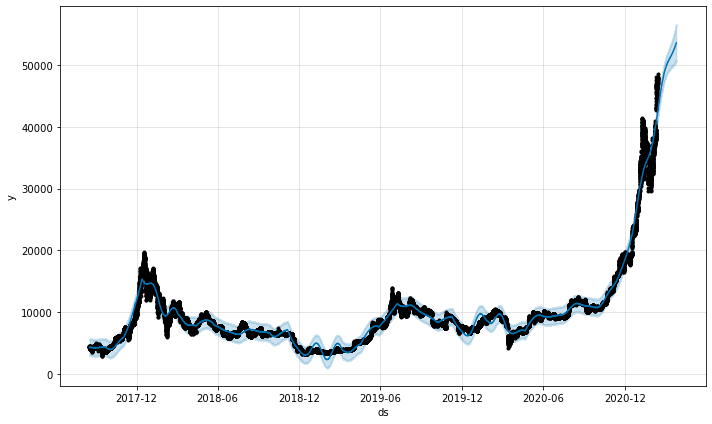

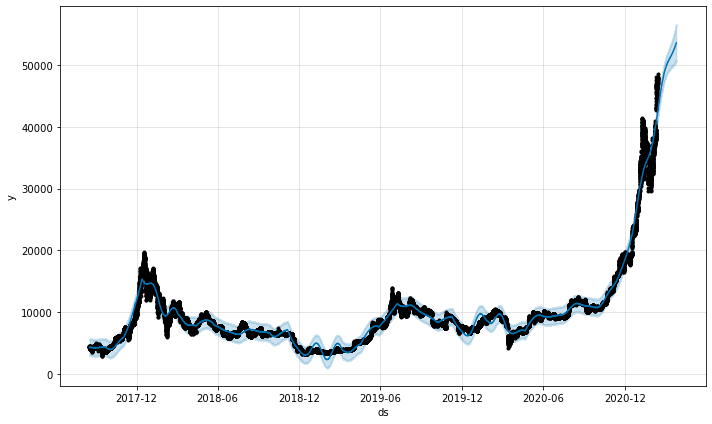

In [16]:
# Plot the Prophet predictions for the Mercado trends data
model.plot(forecast_trends)

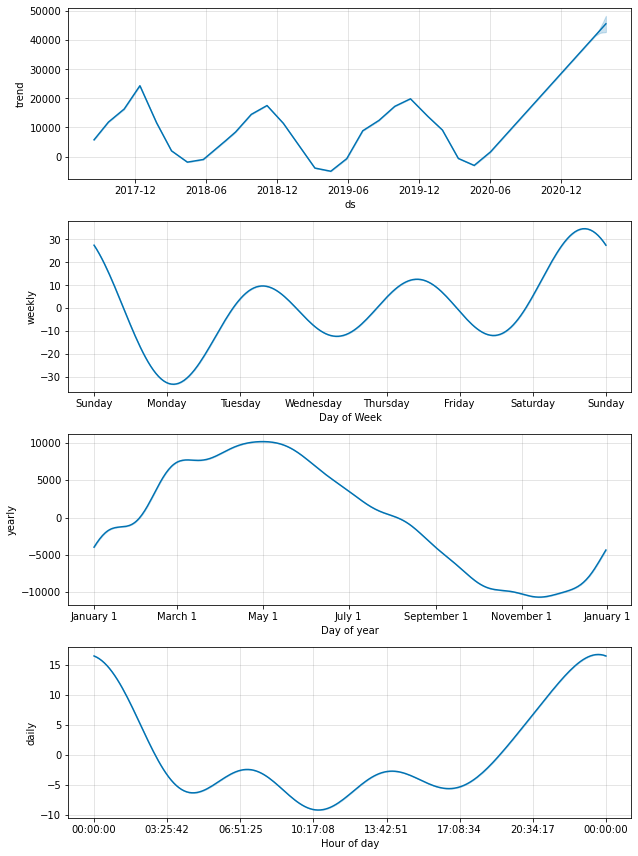

In [17]:
# Use the plot_components function to visualize the forecast results 
figures = model.plot_components(forecast_trends)

### Analyzing Forecasts

In [18]:
# At this point, it's useful to set the `datetime` index of the forecast data.
forecast_trends = forecast_trends.set_index(['ds'])
forecast_trends.head()

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,,,,,,,
2017-08-17 05:00:00,5771.779628,3020.638098,5674.531275,5771.779628,5771.779628,-1486.874791,-1486.874791,-1486.874791,-6.114948,-6.114948,...,10.405574,10.405574,10.405574,-1491.165416,-1491.165416,-1491.165416,0.0,0.0,0.0,4284.904837
2017-08-17 06:00:00,5778.684218,2913.457176,5587.798752,5778.684218,5778.684218,-1490.644914,-1490.644914,-1490.644914,-4.093493,-4.093493,...,11.175370,11.175370,11.175370,-1497.726791,-1497.726791,-1497.726791,0.0,0.0,0.0,4288.039304
2017-08-17 07:00:00,5785.588808,2989.867481,5648.936991,5785.588808,5785.588808,-1494.990549,-1494.990549,-1494.990549,-2.481317,-2.481317,...,11.787697,11.787697,11.787697,-1504.296929,-1504.296929,-1504.296929,0.0,0.0,0.0,4290.598259
2017-08-17 08:00:00,5792.493398,2905.989212,5618.454917,5792.493398,5792.493398,-1502.011760,-1502.011760,-1502.011760,-3.369356,-3.369356,...,12.233381,12.233381,12.233381,-1510.875785,-1510.875785,-1510.875785,0.0,0.0,0.0,4290.481638
2017-08-17 09:00:00,5799.397988,2968.742183,5609.270410,5799.397988,5799.397988,-1511.237985,-1511.237985,-1511.237985,-6.280252,-6.280252,...,12.505582,12.505582,12.505582,-1517.463315,-1517.463315,-1517.463315,0.0,0.0,0.0,4288.160003


### Testing Upper and Lower ranges of a Forecast 
* `yhat` represents the most likely (average) forecast
* `yhat_lower` and `yhat_upper` represents the worst and best case prediction 
    * (These are based on what are known as 80% confidence intervals).

In [14]:
# From the `forecast_trends` DataFrame, use hvPlot to visualize
#  the yhat, yhat_lower, and yhat_upper columns over the last 10 days (24*10 = 240) 
forecast_trends[['yhat', 'yhat_lower', 'yhat_upper']].iloc[-240:, :].hvplot()

:NdOverlay   [Variable]
   :Curve   [ds]   (value)

### Narrowing a Forecast to a Specific Date Range

In [15]:
# Produce a forecast for a specific time window

# Create a `forecast_march_2021` Dataframe, which contains just forecasts for that month
# The DataFrame should include the columns yhat_upper, yhat_lower, and yhat
forecast_march_2021 = forecast_trends.loc['2021-03-01':'2021-03-31'][['yhat_upper', 'yhat_lower', 'yhat']]

# Replace the column names to something less technical sounding
forecast_march_2021 = forecast_march_2021.rename(
    columns={
        'yhat_upper': 'Best Case',
        'yhat_lower':'Worst Case', 
        'yhat':'Most Likely Case'
    }
)

# Review the last five rows of the DataFrame
forecast_march_2021.tail()

,Best Case,Worst Case,Most Likely Case
ds,,,
2021-03-25 17:00:00,55632.894441,49734.797661,52888.029501
2021-03-25 18:00:00,55854.277474,49725.667036,52897.687233
2021-03-25 19:00:00,55658.678183,49465.015338,52908.916437
2021-03-25 20:00:00,56058.459455,49713.447369,52920.801428
2021-03-25 21:00:00,55970.899899,49542.343098,52932.784390


In [16]:
# Display the average forecasted price for March 2021
forecast_march_2021.mean()

Best Case           52819.992363
Worst Case          48696.430653
Most Likely Case    50840.722356
dtype: float64

# This is Where The New Code Begins

# Advanced Forecasting Methods in Facebook Prophet



### Detecting Abrupt Changes in Trend
**Change points** are points of time when the time series abruptly change in their trajectories. Prophet can automatically detect these change points.

In [17]:
# We still have our saved model from above:
model

In [18]:
# We also have the saved forecasts from that model:
# YOUR CODE HERE!

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,,,,,,,
2021-03-25 19:00:00,45258.405051,49465.015338,55658.678183,42153.224055,47966.559479,7650.511386,7650.511386,7650.511386,-0.143161,-0.143161,...,6.377606,6.377606,6.377606,7644.276941,7644.276941,7644.276941,0.0,0.0,0.0,52908.916437
2021-03-25 20:00:00,45264.524635,49713.447369,56058.459455,42149.173228,47983.439273,7656.276793,7656.276793,7656.276793,4.160501,4.160501,...,4.976573,4.976573,4.976573,7647.139719,7647.139719,7647.139719,0.0,0.0,0.0,52920.801428
2021-03-25 21:00:00,45270.644219,49542.343098,55970.899899,42145.122401,48000.319067,7662.140171,7662.140171,7662.140171,8.621700,8.621700,...,3.504998,3.504998,3.504998,7650.013473,7650.013473,7650.013473,0.0,0.0,0.0,52932.784390


In [19]:
# Reset the index of this forecast dataframe in order to use changepoints:
# YOUR CODE HERE!

In [20]:
# import plot change point function
# YOUR CODE HERE!

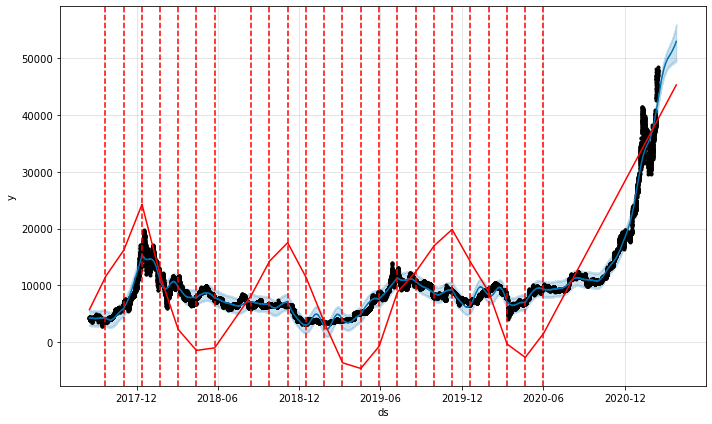

In [21]:
# plot forecast as usual
# YOUR CODE HERE!

# add change points to plot; by default changepoints are only inferred for the first 80% of data to avoid overfitting,
# but this can be changed by using the changepoint_range argument of the model
# YOUR CODE HERE!

In [22]:
# print datetime of detected changepoints 
# YOUR CODE HERE!

984     2017-09-22 05:00:00
1968    2017-11-02 05:00:00
2952    2017-12-13 05:00:00
3936    2018-01-23 05:00:00
4919    2018-03-04 00:00:00
5903    2018-04-14 00:00:00
6887    2018-05-25 00:00:00
7871    2018-07-05 07:00:00
8855    2018-08-15 00:00:00
9839    2018-09-25 00:00:00
10823   2018-11-05 00:00:00
11807   2018-12-16 00:00:00
12790   2019-01-25 23:00:00
13774   2019-03-07 23:00:00
14758   2019-04-17 23:00:00
15742   2019-05-28 23:00:00
16726   2019-07-08 23:00:00
17710   2019-08-18 23:00:00
18694   2019-09-28 23:00:00
19678   2019-11-08 23:00:00
20661   2019-12-19 22:00:00
21645   2020-01-29 22:00:00
22629   2020-03-10 22:00:00
23613   2020-04-20 22:00:00
24597   2020-05-31 22:00:00
Name: ds, dtype: datetime64[ns]